In [1]:
# libs
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import os

from scipy import misc
import glob
import random
import cv2

## Dataset description 

**The KAIST Multispectral Pedestrian Dataset** consists of 95k color-thermal pairs (640x480, 20Hz) taken from a vehicle. All the pairs are manually annotated (person, people, cyclist) for the total of 103,128 dense annotations and 1,182 unique pedestrians.

![title](img/train.PNG)
![title](img/test.PNG)

## Annotations examples

In [2]:
true_bboxs = []
for vid_set in sorted(os.listdir('data/train_all/annotations/')):
    for vid in sorted(os.listdir('data/train_all/annotations/'+vid_set)):
        
        for i, k in enumerate(sorted(os.listdir('data/train_all/annotations/'+vid_set+'/' + vid))):
            f = open('data/train_all/annotations/'+vid_set+'/' +vid + '/' +k,"r")
            bboxs = f.readlines()

            if len(bboxs)>1:
                for bbox in bboxs[1:]:
                    splitted = bbox.split(' ')
                    im_id = k[:-4]
                    cls = splitted[0]
                    x = splitted[1]
                    y = splitted[2]
                    width = splitted[3]
                    height = splitted[4]
                    
                    true_bboxs.append([vid_set, vid, im_id, cls, x, y, width, height])
            

In [3]:
data = pd.DataFrame(true_bboxs, columns=['SET', 'VID', 'IM_ID', 'CLS', 'X', 'Y', 'W', 'H'])

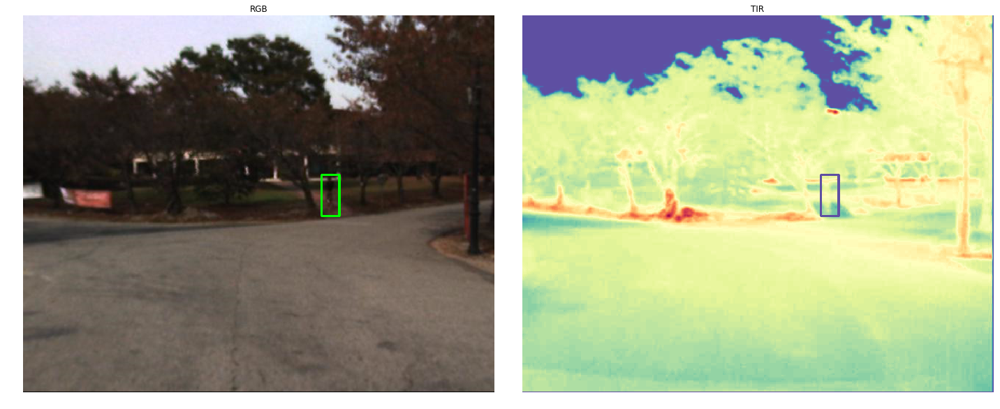

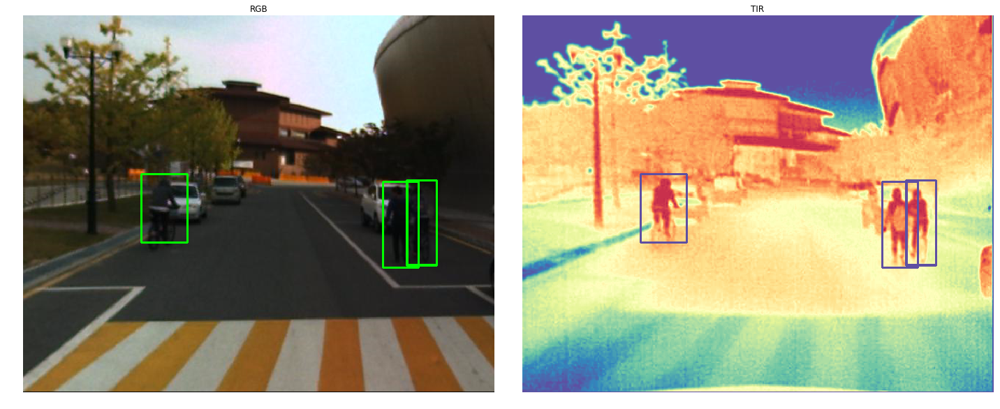

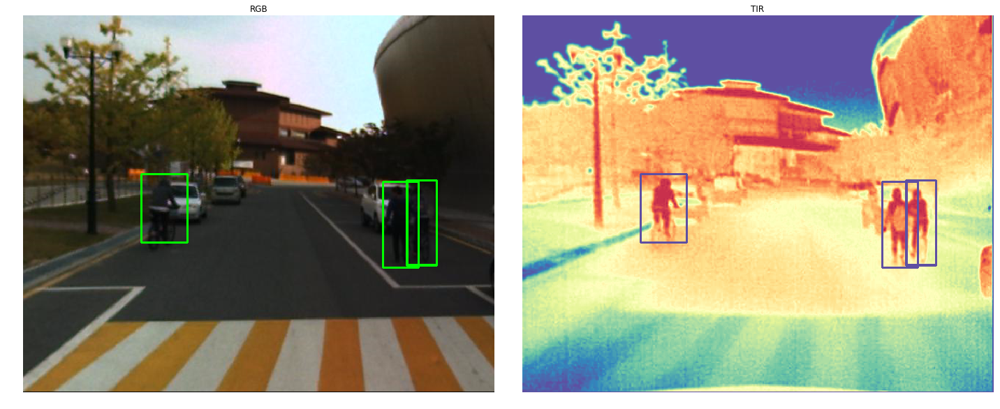

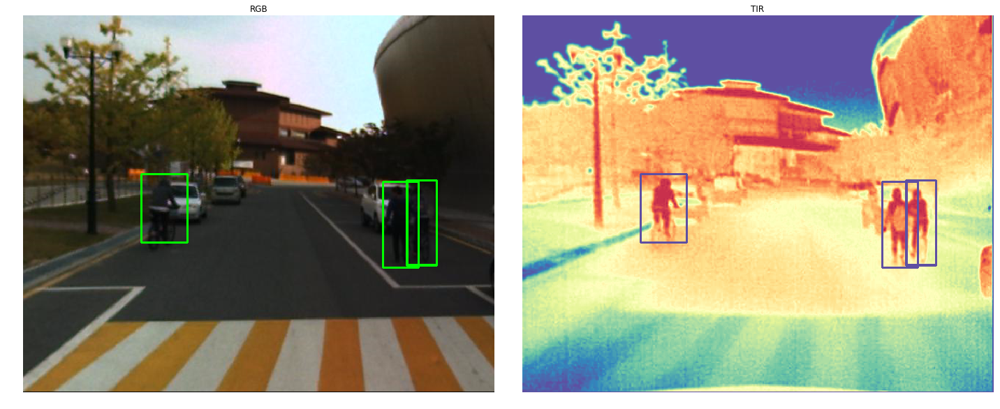

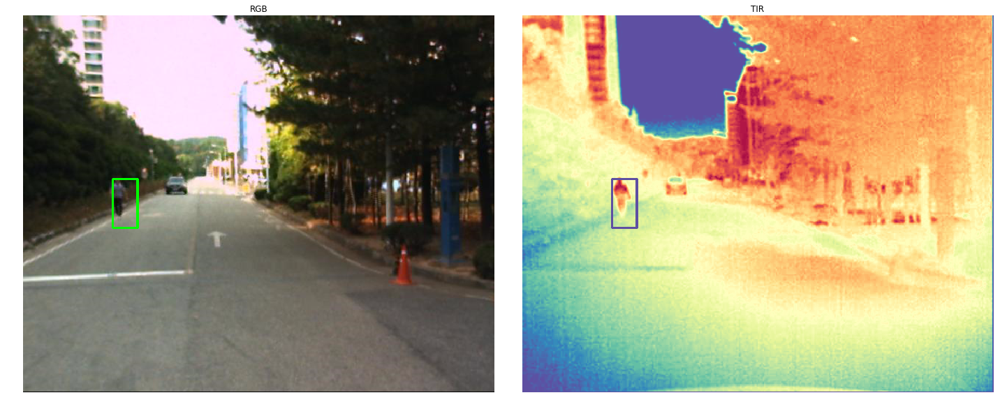

...

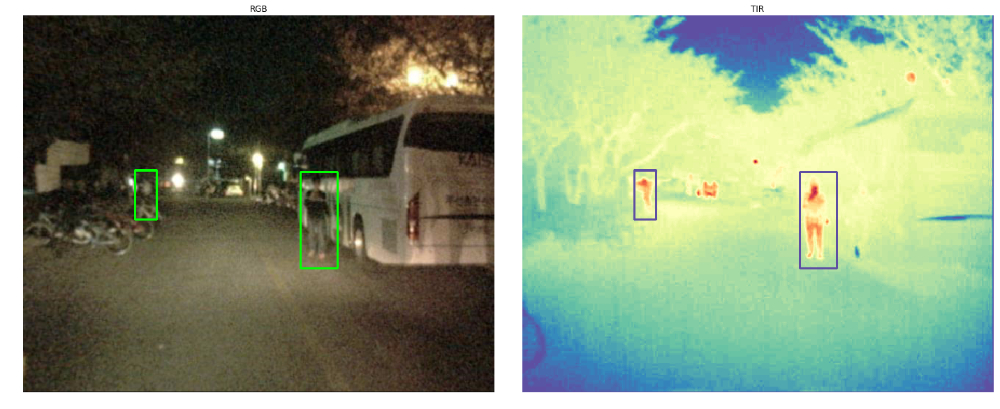

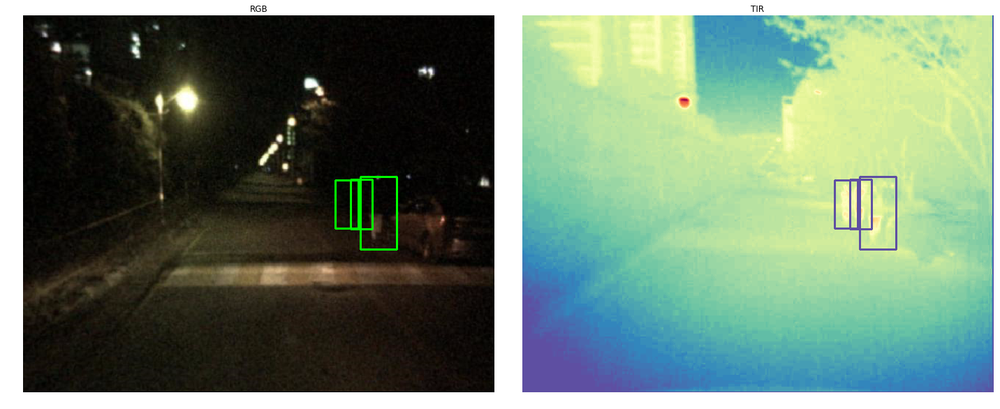

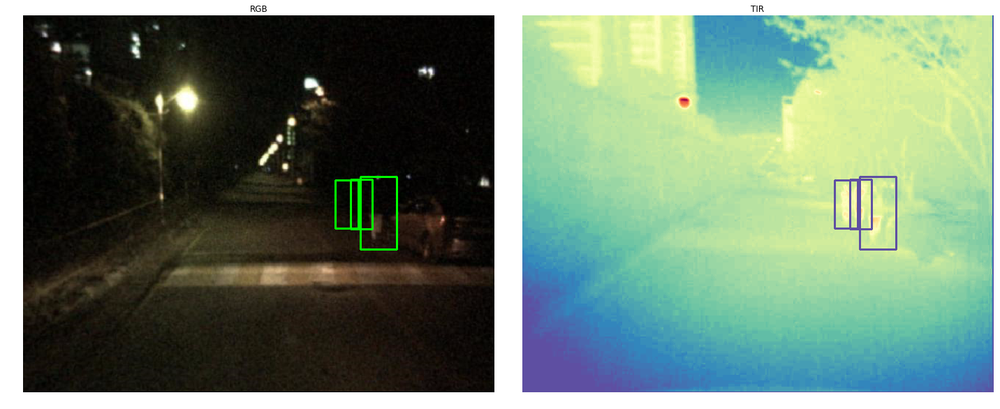

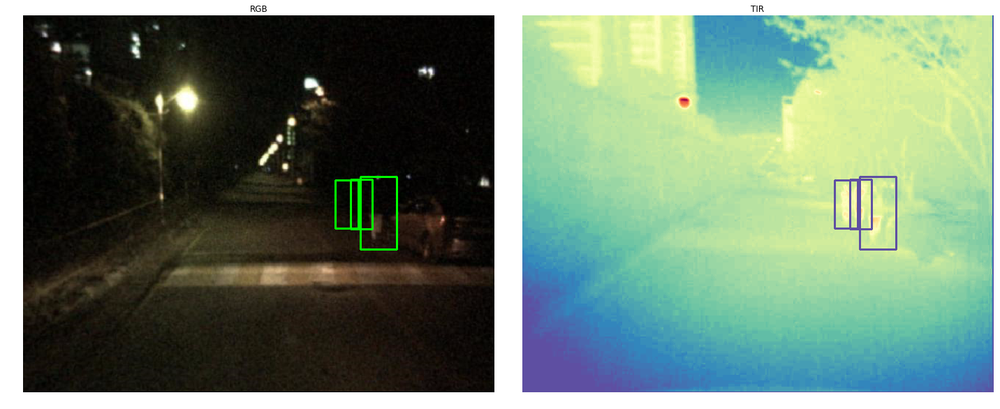

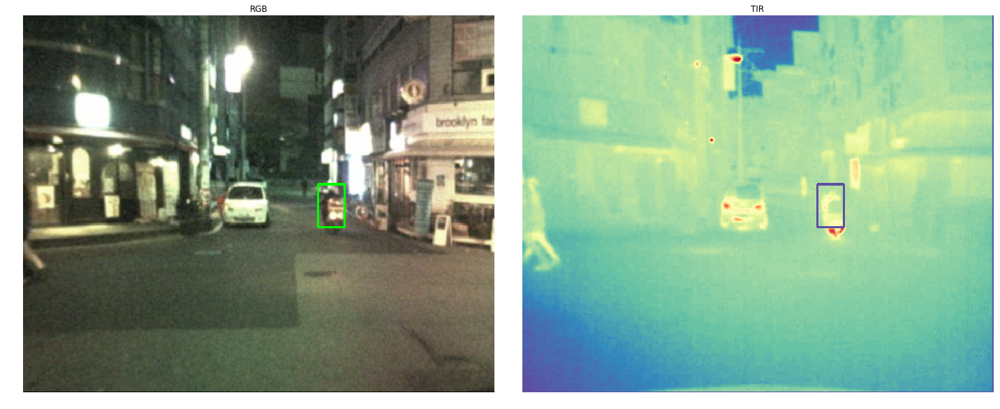

In [5]:
for IM_ID in data.IM_ID.unique()[:1]:
    id_data = data[data.IM_ID == IM_ID]
    
    for idx, row in id_data.iterrows(): 
        vid_set = row[0]
        vid = row[1]
    
        image = misc.imread(('data/train_all/images/' + vid_set + '/' + vid +'/' + IM_ID + '.png'))
    
        # split data to RGB and TIR
        rgb = image[:,:,:3]
        tir = image[:,:,3]

        # Change
        new_rgb = rgb.copy() 
        new_tir = tir.copy()
        img_data = data[(data.IM_ID == IM_ID) & (data.SET == vid_set) & (data.VID == vid)]
        
        for idx, row in img_data.iterrows():    
            x=int(row[4])
            y=int(row[5])
            w=int(row[6])
            h=int(row[7])
            cv2.rectangle(new_rgb,(x,y),(x+w,y+h),(0,255,0),2)
            cv2.rectangle(new_tir,(x,y),(x+w,y+h),(0,255,0),2) 
        
        fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(20, 20))
        ax = axes.ravel()
        ax[0].imshow(new_rgb)
        ax[0].set_title('RGB')
        ax[0].axis('off')
        ax[1].imshow(new_tir, cmap=plt.get_cmap('Spectral_r'))
        ax[1].set_title('TIR')
        ax[1].axis('off')
        plt.tight_layout()
        plt.show()
        fig.savefig('figures/'+IM_ID+vid_set+vid+'.png')

    